In [11]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
from pathlib import Path
import os

_current_fname = Path(locals()["__vsc_ipynb_file__"])
os.chdir(_current_fname.parent)

In [13]:
import sys

sys.path.append("../")
import my_sam2_utils as utils

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import zarr
import copick
import sys
from tqdm.notebook import tqdm
import scipy
import joblib

In [15]:
copick_config = (
    "/hpc/projects/group.czii/krios1.processing/copick/24jul29c/run002/copick_config.json"
)
name = "lysosome"

# Open Copick Project and Query All Available Runs
root = copick.from_file(copick_config)
run_ids = [run.name for run in root.runs]

In [16]:
membrane_threshold = 50000

In [8]:
memb_runs = []
for run in tqdm(root.runs):
    membrane = utils.get_membrane(run, verbose=False)
    if membrane.sum() < membrane_threshold:
        continue
    memb_runs.append(run)

  0%|          | 0/266 [00:00<?, ?it/s]

### This is for cryosam2_5 results

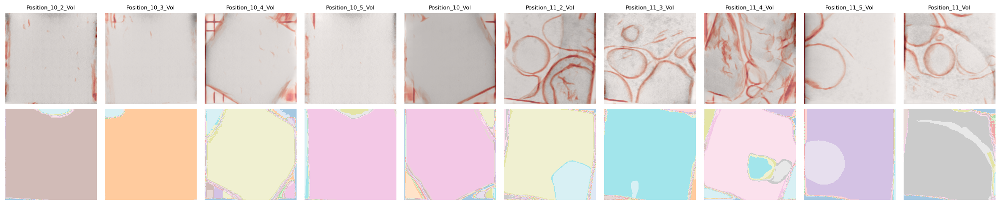

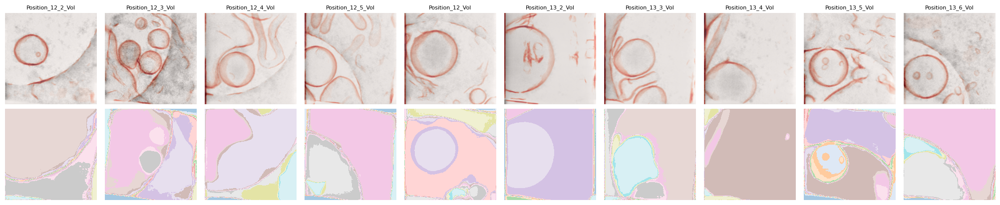

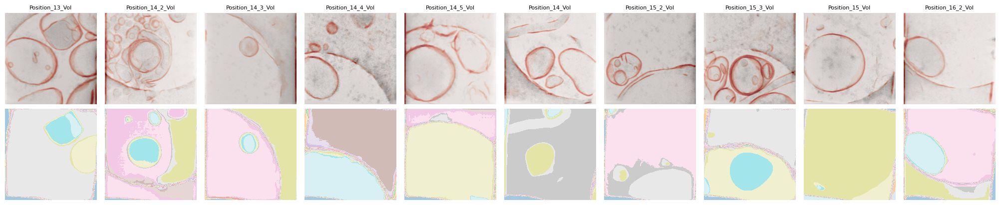

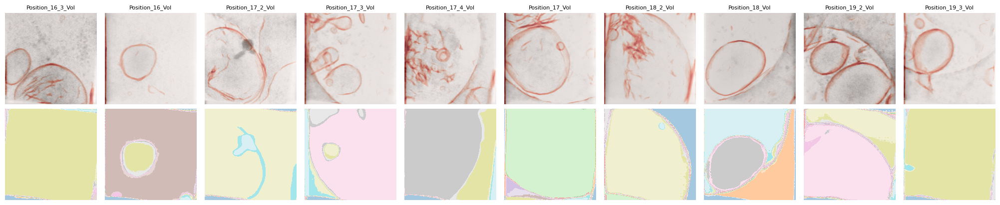

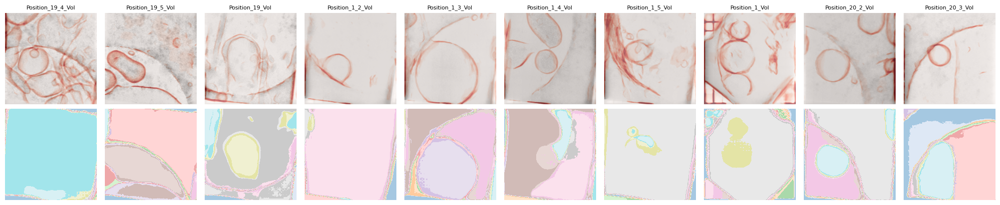

...

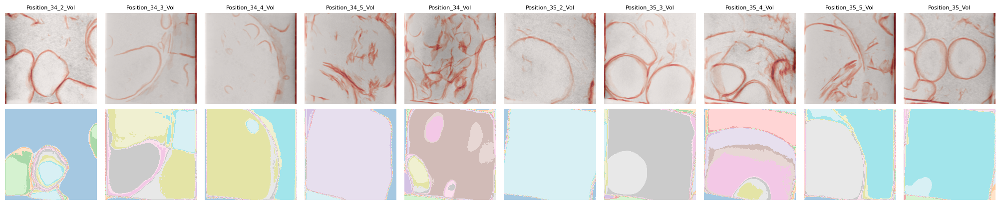

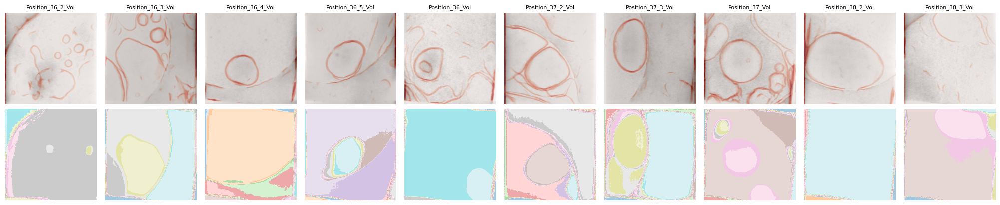

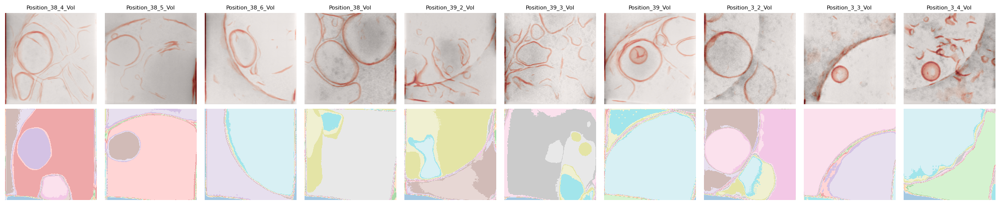

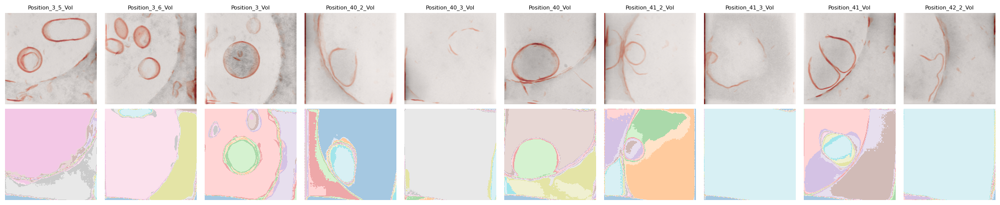

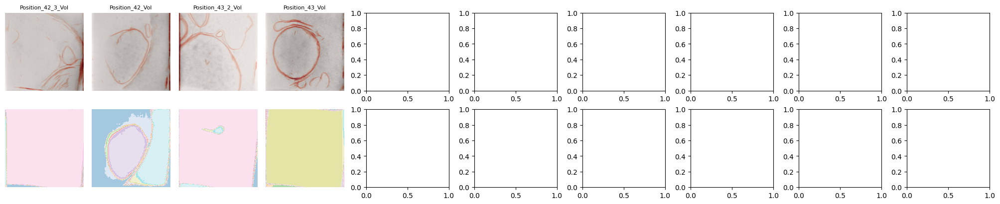

In [29]:
cryosam_idx = 5

pw_rows = []
pw_new_col = []
fig = None
fig_col_count = 0
verbose = False

organelle_segs_all = []
no_organelles_all = []
no_cryosam = []
for run in memb_runs:
    organelle_segs = run.get_segmentations("cryoSAM2", session_id=str(cryosam_idx))
    if len(organelle_segs) == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no cyoSAM outputs")
        no_cryosam.append(run)
        continue
    elif organelle_segs[0].numpy().max() == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no organelle segmentation")
        no_organelles_all.append(run)
        continue
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(2, 10, figsize=(20, 4), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")

    if len(organelle_segs) == 0:
        axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
    else:
        cm = axs[fig_col_count + 10].imshow(
            organelle_segs[0].numpy().sum(axis=0), cmap="tab20", alpha=0.4
        )
        axs[fig_col_count + 10].axis("off")
        # axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
        # plt.colorbar(cm, ax=axs[fig_col_count + 10], fraction=0.046, pad=0.04)
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    organelle_segs_all.append(run)
    # raise


In [18]:
fig = None
fig_col_count = 0
no_organelles = []
for run in no_organelles_all:
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(1, 10, figsize=(20, 2), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    # raise


### This is for my results without postprocessing

In [22]:
!pwd

/hpc/mydata/saugat.kandel/sam2_projects/segment-anything-2/notebooks/cryosam_results_analysis


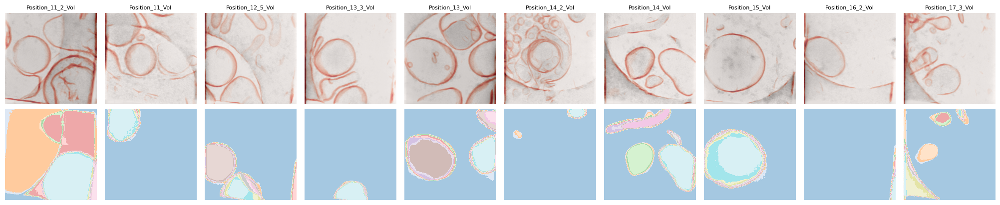

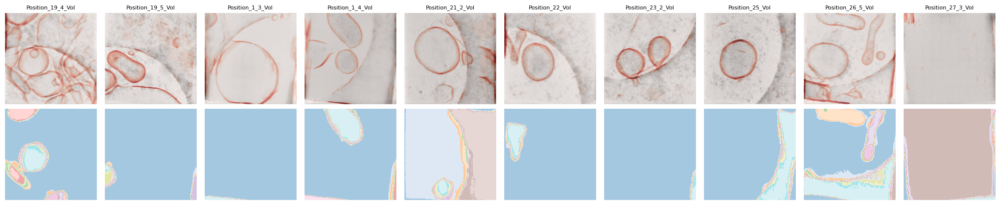

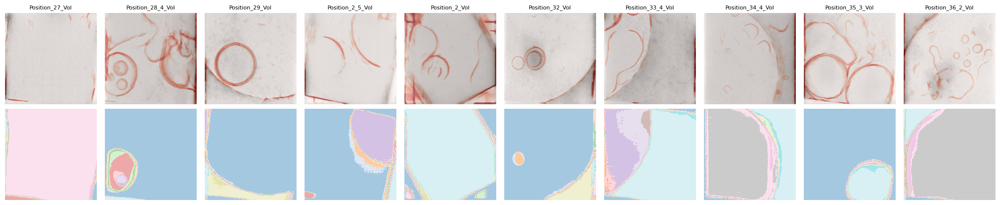

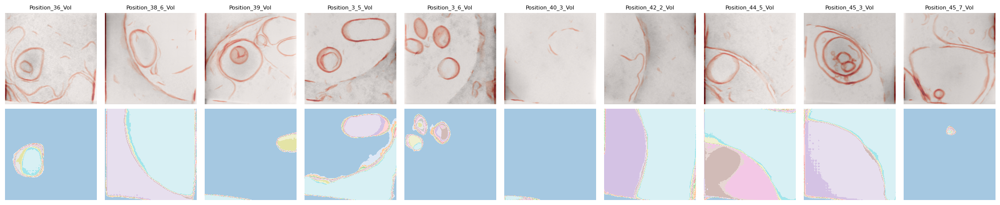

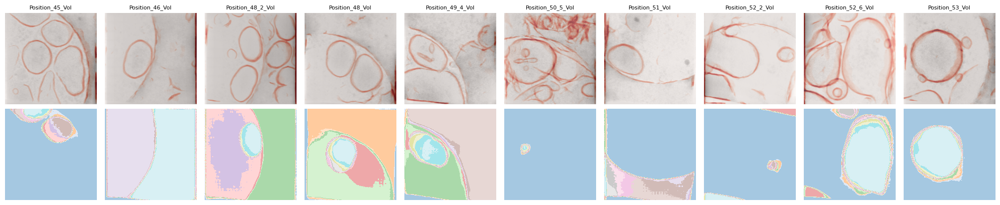

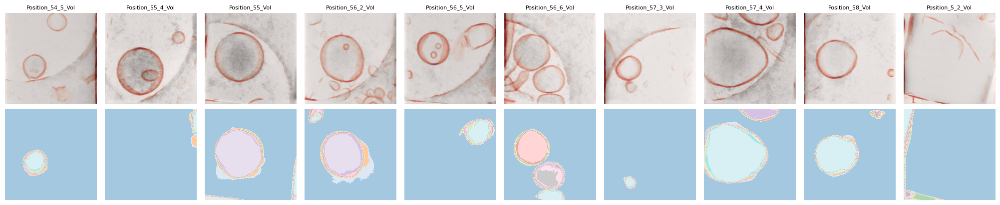

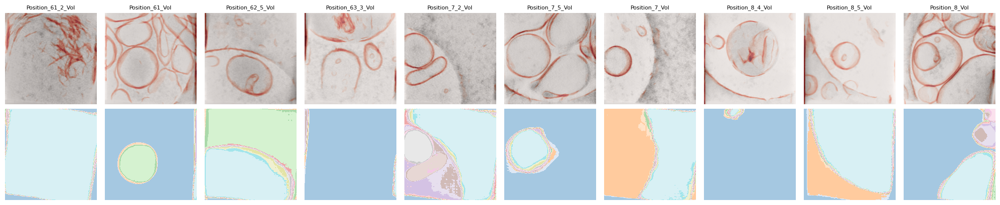

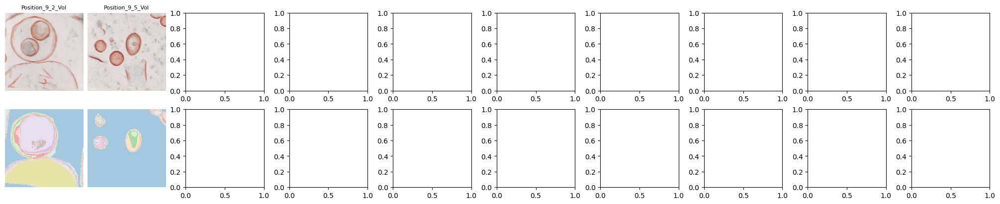

In [27]:
cryosam_idx = 5

pw_rows = []
pw_new_col = []
fig = None
fig_col_count = 0
verbose = False

organelle_segs_all = []
no_organelles_all = []
no_cryosam = []
for run in memb_runs:
    vol_mask_fname = Path("../cryosam_outputs") / f"vol_mask_{run.name}.pkl"

    if not vol_mask_fname.exists():
        if verbose:
            print(f"Skipping {run.name} as it has no cyoSAM outputs")
        no_cryosam.append(run)
        continue

    vol_mask = joblib.load(vol_mask_fname)
    if vol_mask.max() == 0:
        if verbose:
            print(f"Skipping {run.name} as it has no organelle segmentation")
        no_organelles_all.append(run)
        continue
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(2, 10, figsize=(20, 4), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")

    cm = axs[fig_col_count + 10].imshow(vol_mask.sum(axis=0), cmap="tab20", alpha=0.4)
    axs[fig_col_count + 10].axis("off")
    # axs[fig_col_count + 10].set_title("No_org_seg", fontsize=8)
    # plt.colorbar(cm, ax=axs[fig_col_count + 10], fraction=0.046, pad=0.04)
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    organelle_segs_all.append(run)
    # raise


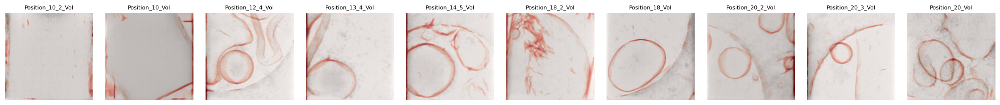

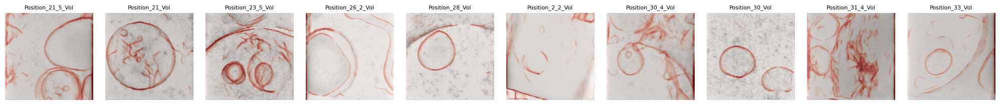

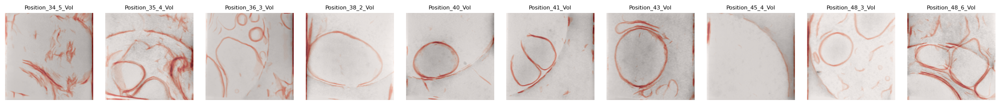

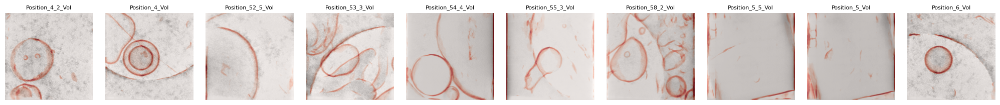

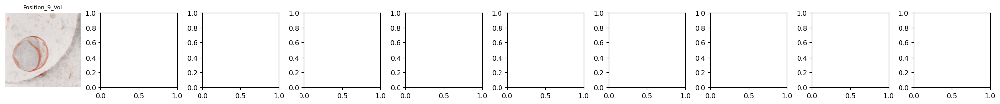

In [28]:
fig = None
fig_col_count = 0
no_organelles = []
for run in no_organelles_all:
    tomo = utils.get_tomogram(run, verbose=False)
    membrane = utils.get_membrane(run, verbose=False)

    if fig is None:
        fig, axs = plt.subplots(1, 10, figsize=(20, 2), constrained_layout=True)
        axs = axs.ravel()
    axs[fig_col_count].imshow(tomo.sum(axis=0), cmap="gray")
    axs[fig_col_count].imshow(membrane.sum(axis=0), cmap="Reds", alpha=0.5)
    axs[fig_col_count].set_title(run.name, fontsize=8)
    axs[fig_col_count].axis("off")
    fig_col_count += 1
    if fig_col_count == 10:
        fig_col_count = 0
        plt.show()
        fig = None
    # raise


In [31]:
### Look at the masks generated

In [33]:
masks_2d = {}
for run in memb_runs:
    mask_fname = Path("../cryosam_outputs") / f"auto_masks_{run.name}.pkl"
    if not mask_fname.exists():
        continue
    masks_2d[run.name] = joblib.load(mask_fname)

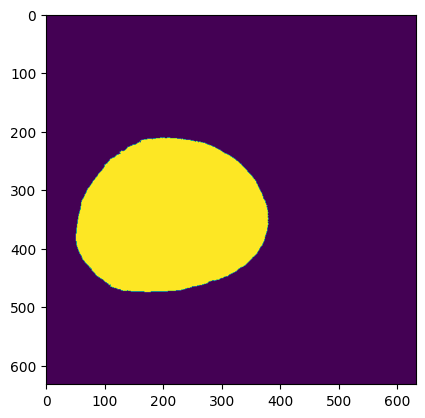

In [37]:
plt.imshow(masks_2d["Position_40_Vol"][0]["segmentation"])

In [38]:
vol_mask = joblib.load(Path("../cryosam_outputs") / "vol_mask_Position_40_Vol.pkl")

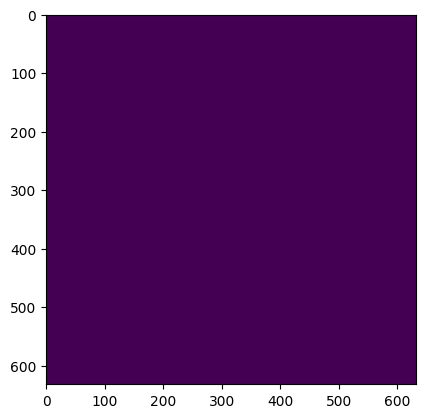

In [39]:
plt.imshow(vol_mask.sum(axis=0))

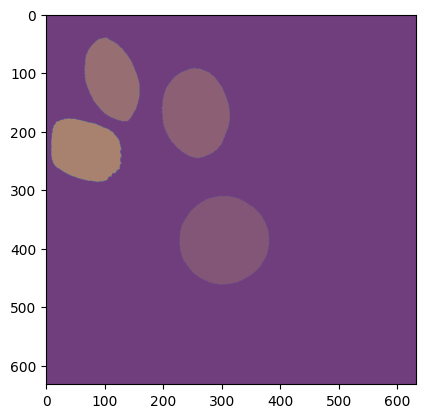

In [49]:
for _mask in masks_2d["Position_3_6_Vol"]:
    plt.imshow(_mask["segmentation"], alpha=0.3)